**References:**
* https://www.kaggle.com/juliensiems/cleaning-new-features-gps-coordinates-included
* https://www.kaggle.com/juliencs/a-study-on-regression-applied-to-the-ames-dataset
* https://www.kaggle.com/apapiu/regularized-linear-models

# House Prices Dataset | Data Exploration
## Import Libraries

Training set has 1460 observations and 79 features.
Test set has 1459 observations and 79 features.
(2919, 79)


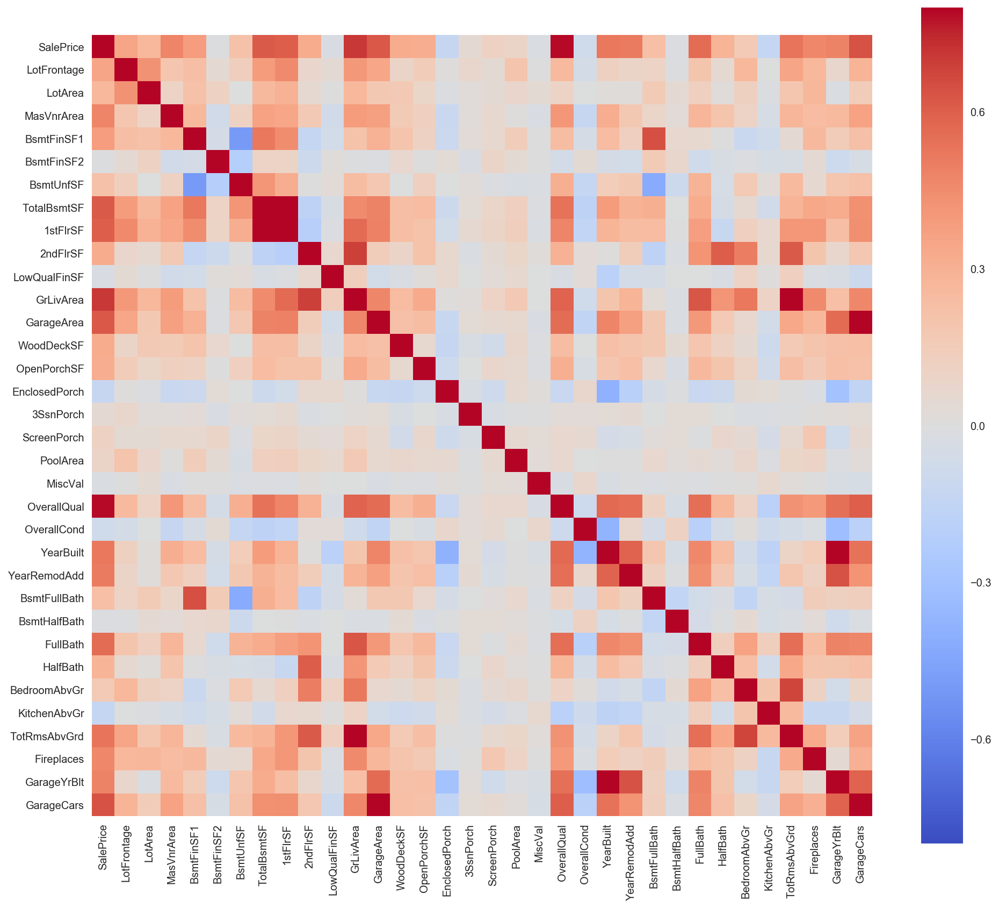

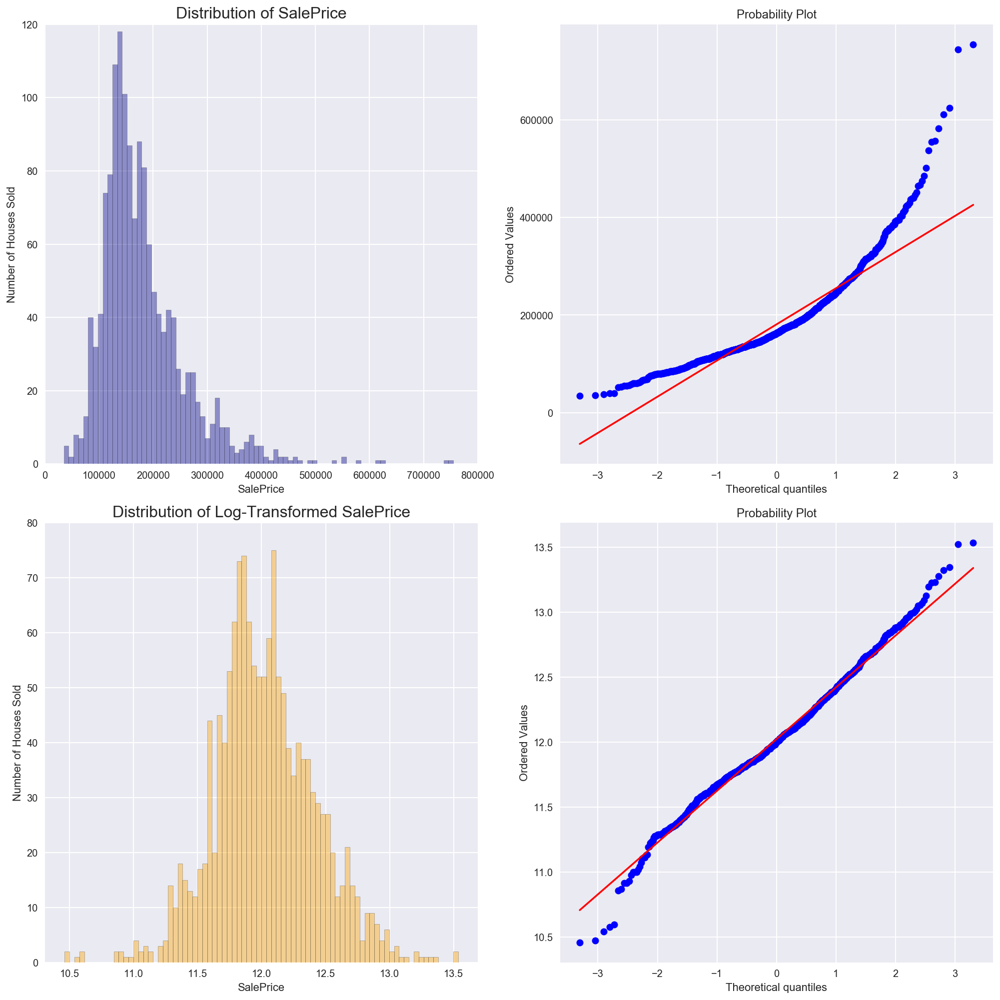

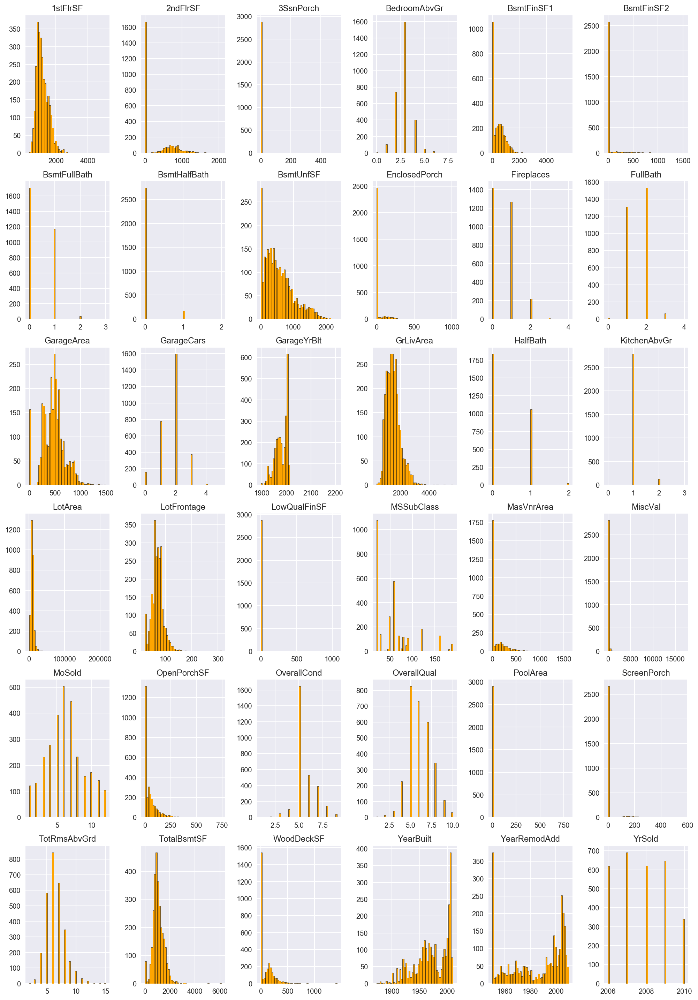

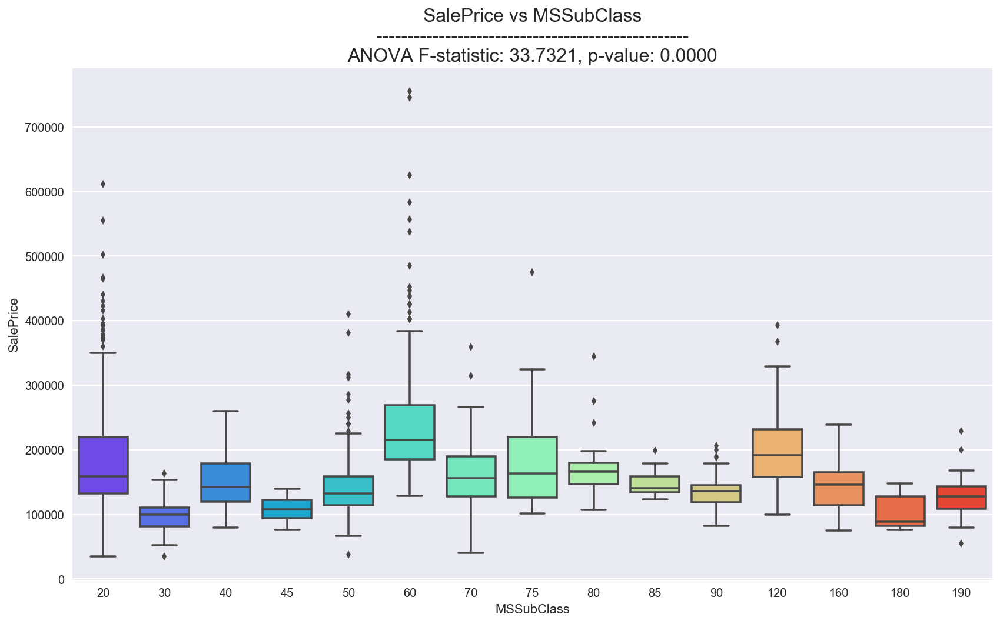

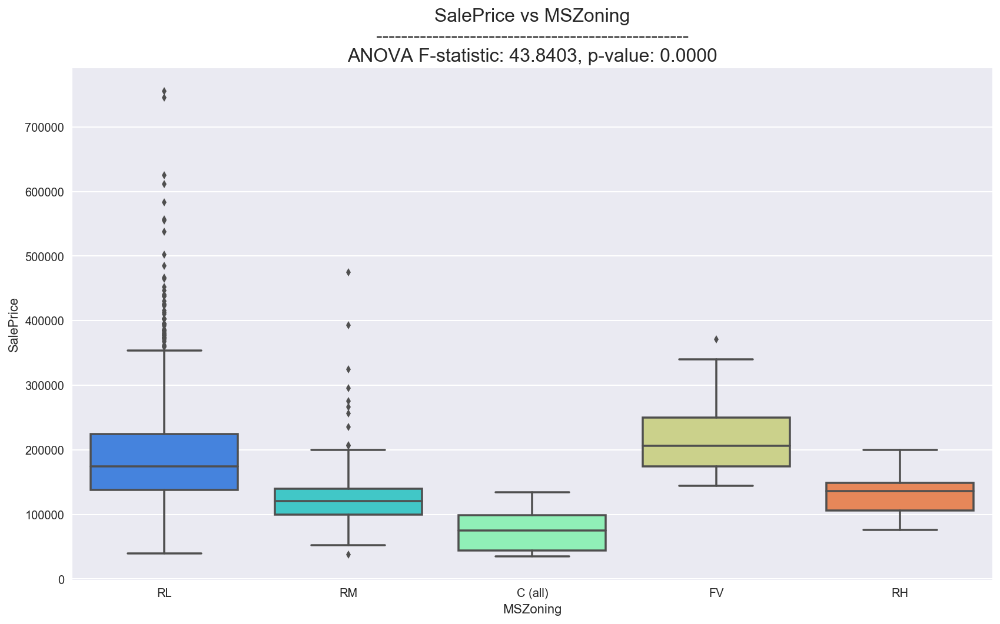

...

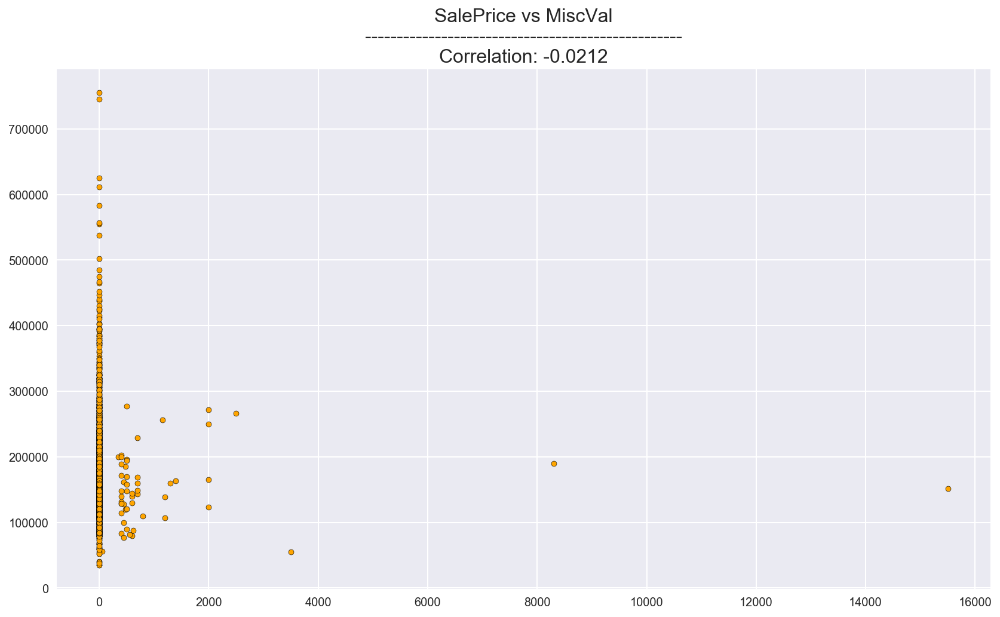

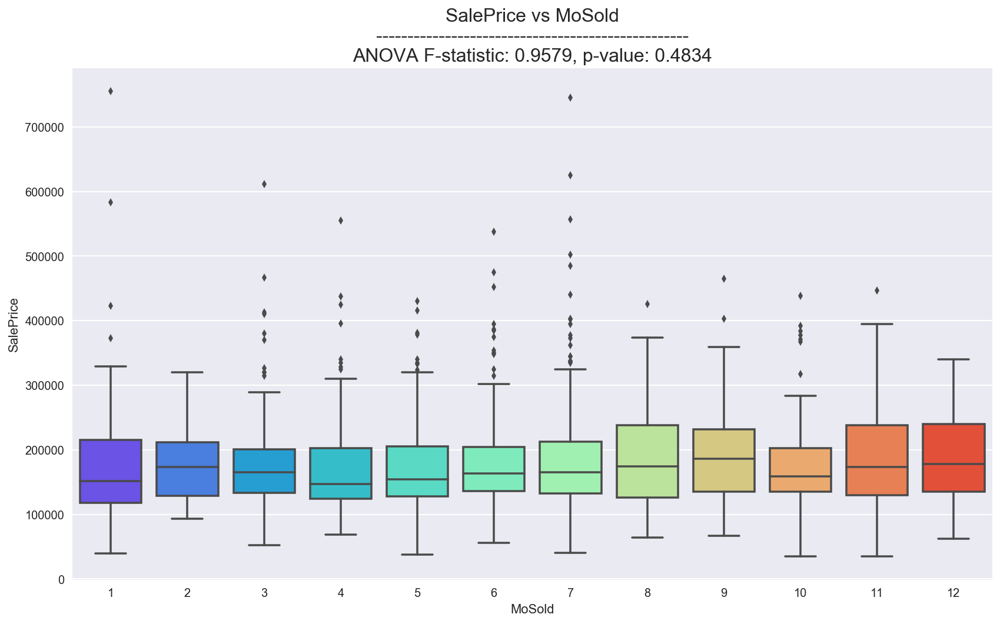

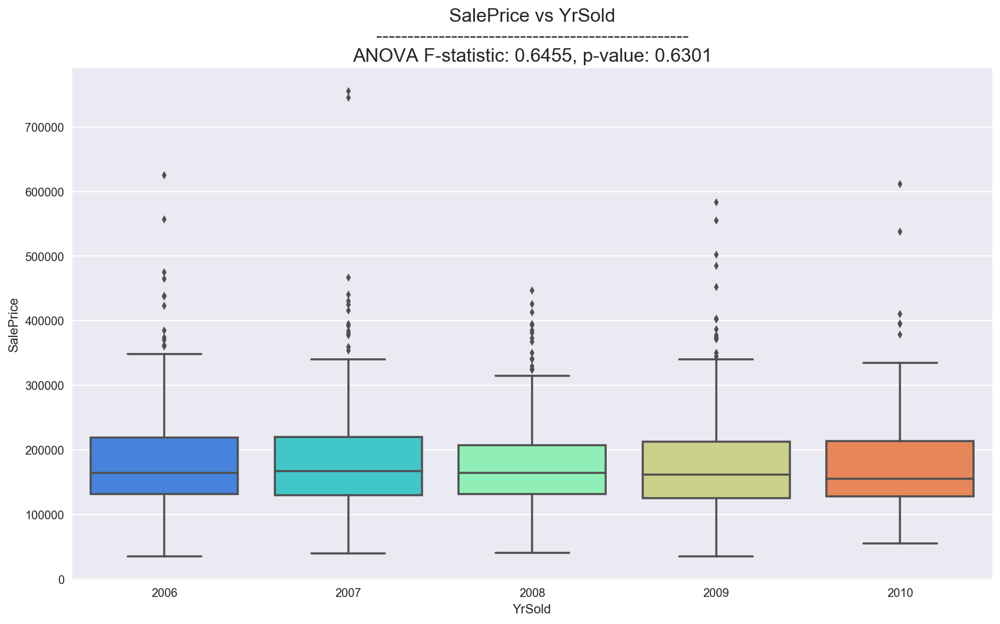

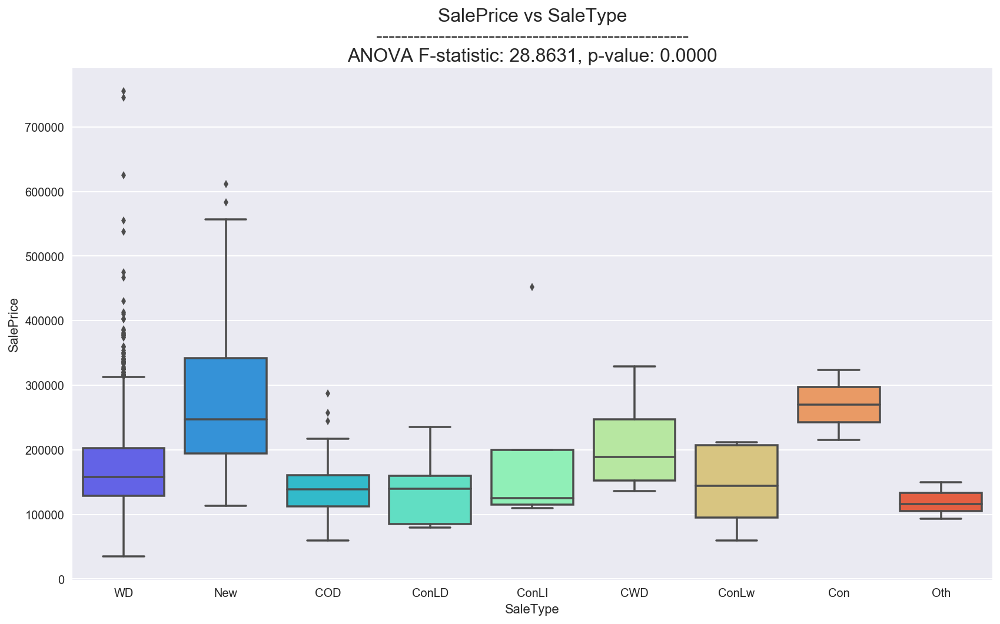

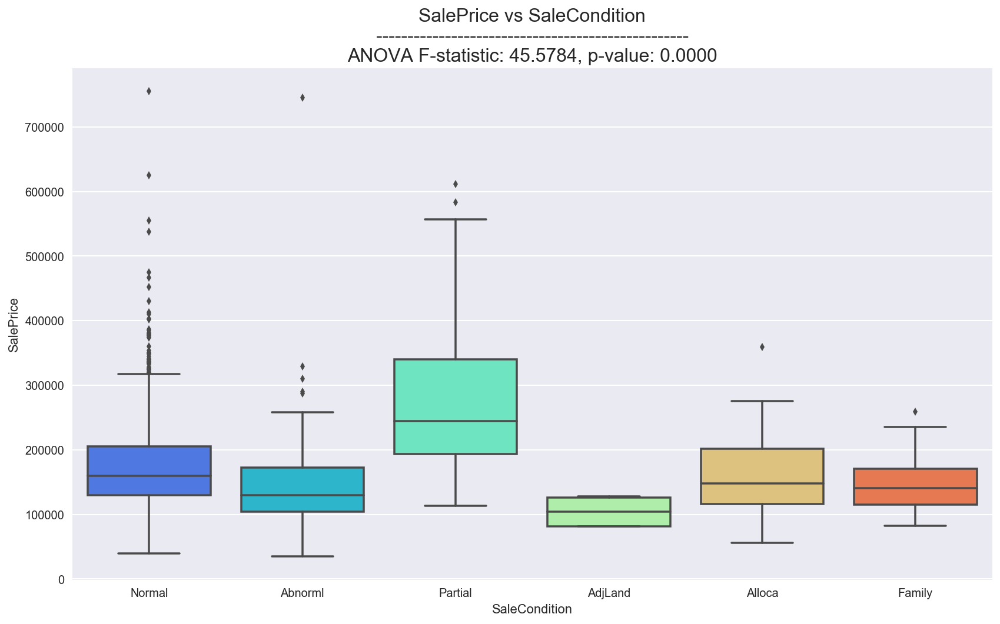

['Street', 'Utilities', 'LandSlope', 'BsmtFinSF2', 'LowQualFinSF', 'BsmtHalfBath', '3SsnPorch', 'PoolArea', 'PoolQC', 'MiscFeature', 'MiscVal', 'MoSold', 'YrSold']


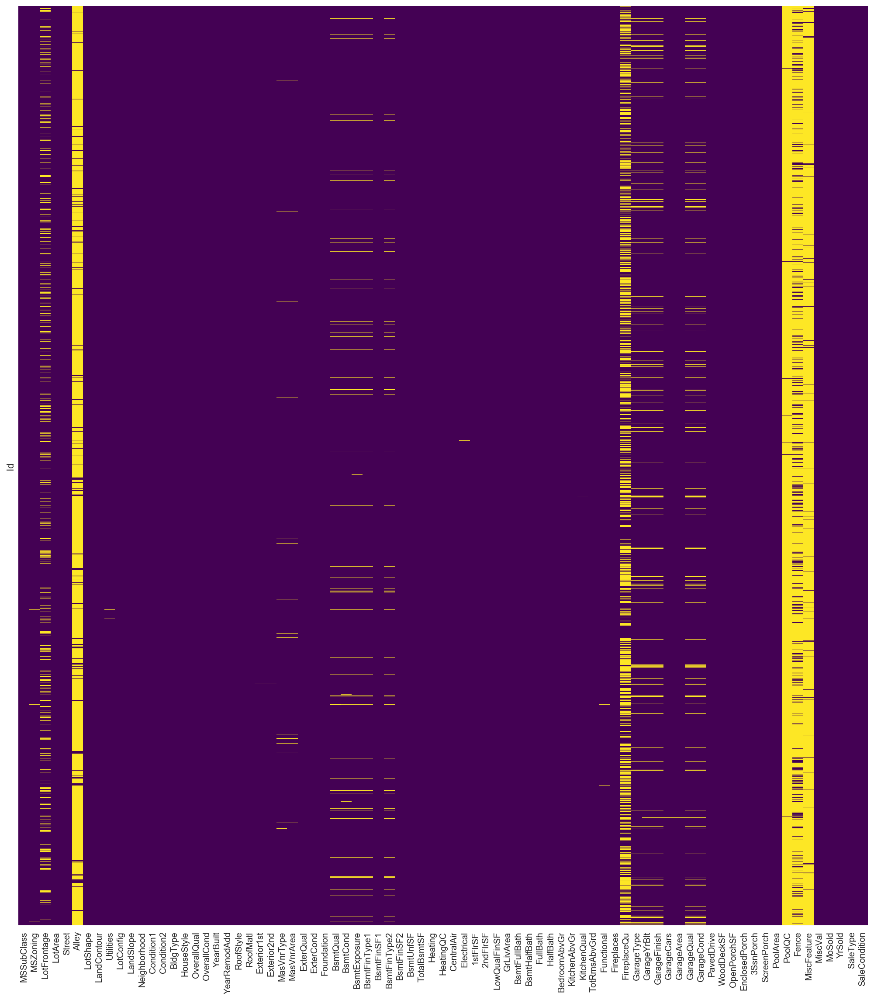

(2919, 79)


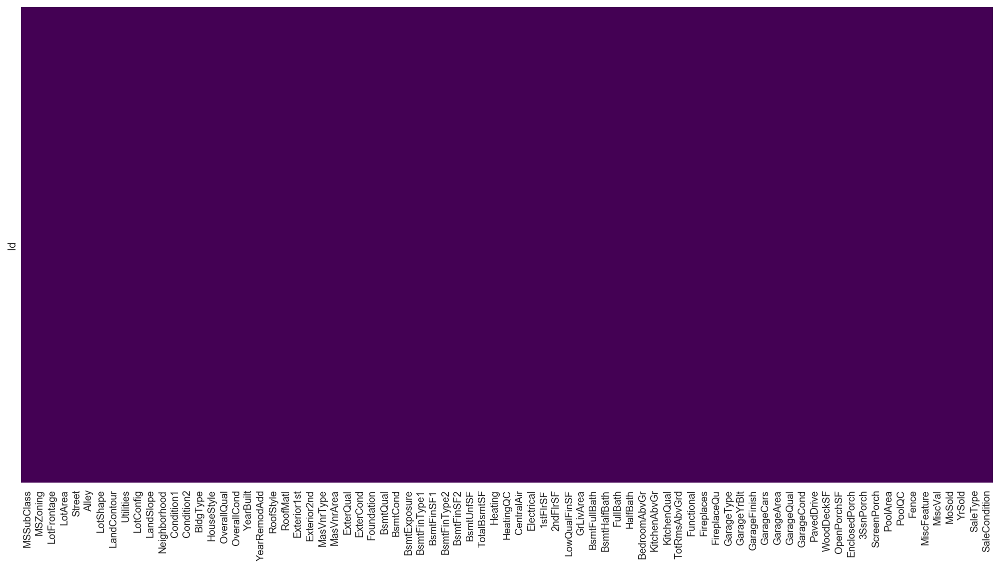

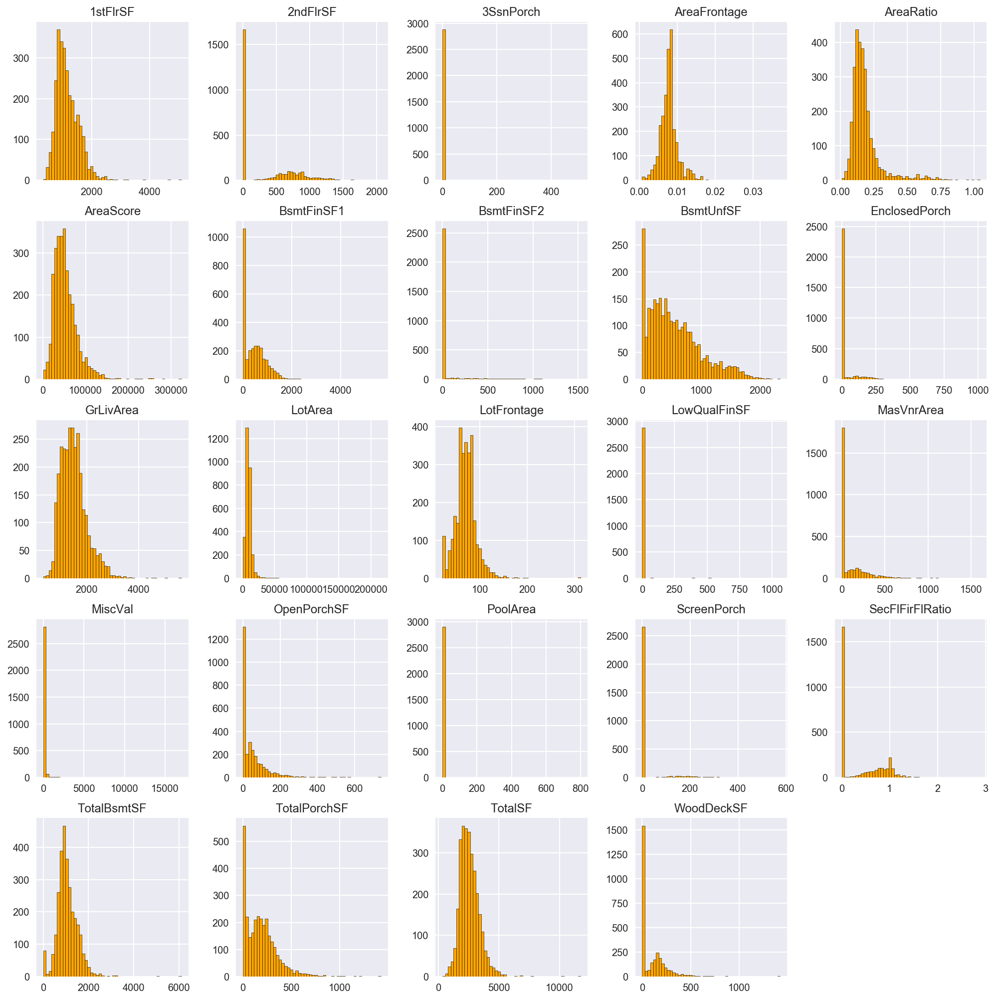

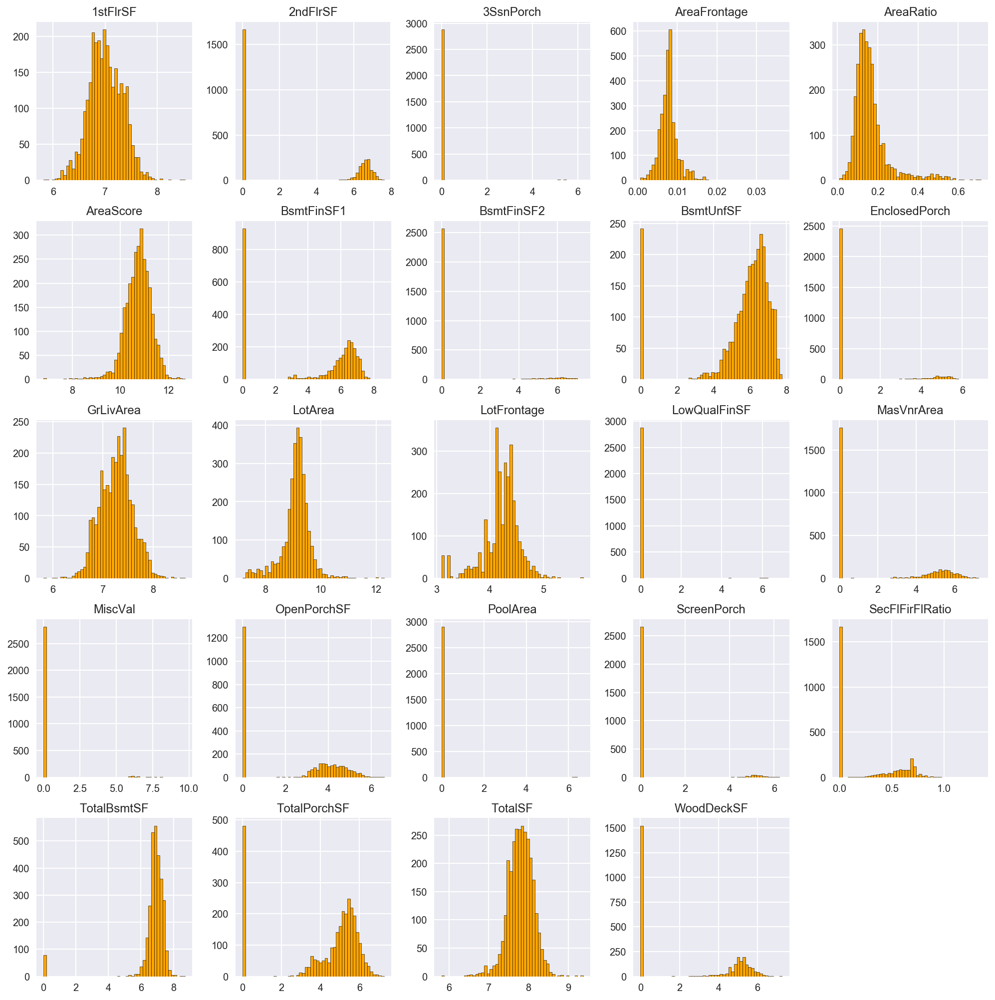

Index(['MSSubClass', 'MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour',
       'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1',
       'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl',
       'Exterior1st', 'Exterior2nd', 'MasVnrType', 'Foundation', 'Heating',
       'CentralAir', 'Electrical', 'GarageType', 'Fence', 'MiscFeature',
       'SaleType', 'SaleCondition'],
      dtype='object')


In [1]:
%run I_HousePrices_FeatureEngineering.ipynb

# House Prices Dataset | Machine Learning
## Prepare Dataset for Training
### Separate Training and Test sets

In [2]:
X = final_df.iloc[:train_df.shape[0], :].as_matrix()
X_test = final_df.iloc[train_df.shape[0]:, :].as_matrix()
y = train_df.SalePrice.values.copy()
y = np.log1p(y)
print(X.shape, X_test.shape, y.shape)

(1460, 238) (1459, 238) (1460,)


### Scale data

In [3]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scX = scaler.fit_transform(X)
X_test = scaler.transform(X_test)

### Create validation set with 20% of the data

In [4]:
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(scX, y, test_size=0.2, random_state=555)
print(X_train.shape, X_val.shape, y_train.shape, y_val.shape)

(1168, 238) (292, 238) (1168,) (292,)


## Modelling

In [5]:
from sklearn.model_selection import learning_curve, cross_val_score, GridSearchCV, RandomizedSearchCV
from sklearn.feature_selection import SelectFromModel
from sklearn.decomposition import KernelPCA
from sklearn.linear_model import RidgeCV, LassoCV, ElasticNetCV 
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
import xgboost as xgb
from sklearn.metrics import mean_squared_error

/Users/hugobmachado/anaconda/envs/DeepLearning/lib/python3.5/site-packages/sklearn/cross_validation.py:44: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)


Define **Root Mean Squared Logarithmic Error** function as this is the scoring method used in Kaggle.

### PCA
Check: [PCA](http://scikit-learn.org/stable/modules/decomposition.html#pca)

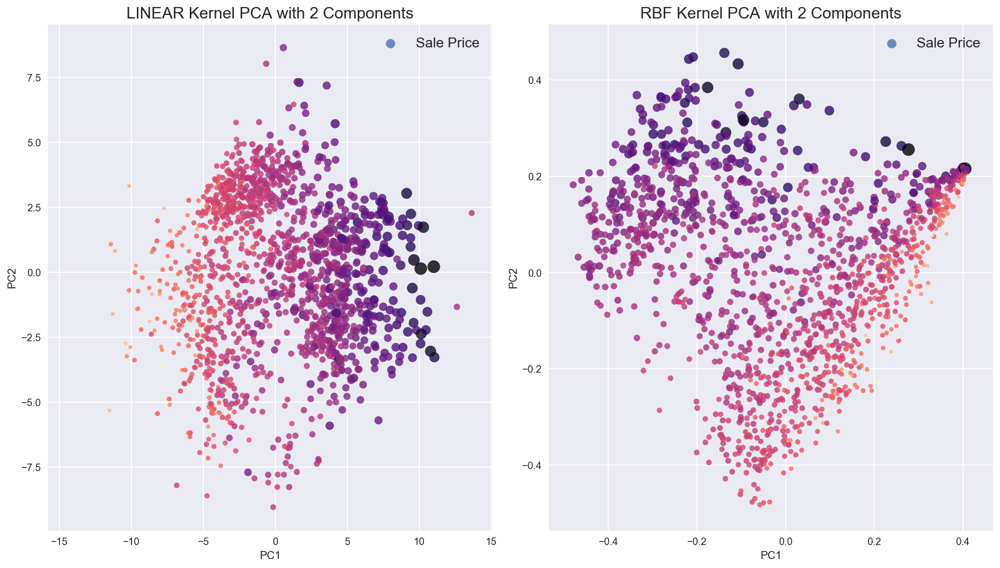

In [6]:
kpca = KernelPCA(n_components=2, kernel='linear')
kpcaX = kpca.fit_transform(scX)

plt.figure(figsize=(14, 8))
plt.subplot(121)
plt.scatter(kpcaX[:, 0], kpcaX[:, 1], 
            s=np.expm1(y)/5000, c=y, label='Sale Price',
            cmap=plt.get_cmap('magma_r'), alpha=.8)
plt.title('{} Kernel PCA with 2 Components'.format(kpca.kernel.upper()), fontsize=16); 
plt.xlabel('PC1'); plt.ylabel('PC2')
plt.legend(fontsize=14)

kpca = KernelPCA(n_components=2, kernel='rbf')
kpcaX = kpca.fit_transform(scX)

plt.subplot(122)
plt.scatter(kpcaX[:, 0], kpcaX[:, 1], 
            s=np.expm1(y)/5000, c=y, label='Sale Price',
            cmap=plt.get_cmap('magma_r'), alpha=.8)
plt.title('{} Kernel PCA with 2 Components'.format(kpca.kernel.upper()), fontsize=16); 
plt.xlabel('PC1'); plt.ylabel('PC2')
plt.legend(fontsize=14)

plt.tight_layout()

### Ridge Regression
Check: [Ridge](http://scikit-learn.org/stable/modules/linear_model.html#ridge-regression)
#### Initialize and Fit Model

In [7]:
regressor_ridge = RidgeCV(
    alphas=(30, 100, 400, 470, 480, 490),
    scoring='neg_mean_squared_error', cv=10
)
regressor_ridge.fit(scX, y)
print('Best alpha: {}'.format(regressor_ridge.alpha_))

Best alpha: 480


#### Feature Importance & Learning Curves

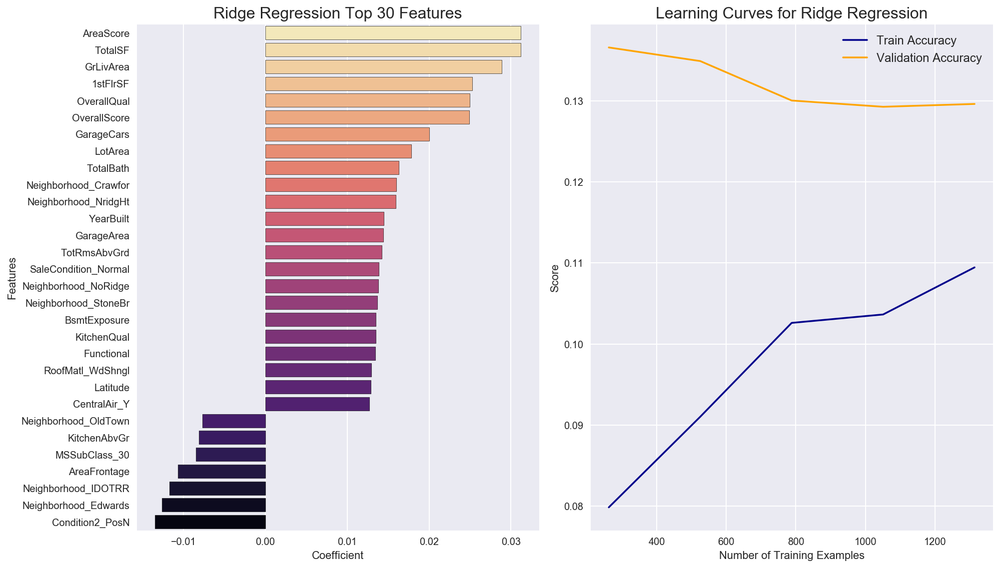

In [8]:
# Extract coefficients
num_features = 30
ridge_coef = pd.Series(data=regressor_ridge.coef_, index = final_df.columns.values)
imp_coef = pd.concat([ridge_coef.sort_values(ascending=False).head(int(num_features//1.3)),
                       ridge_coef.sort_values(ascending=False).tail(int(num_features-num_features//1.3))])

# Calculate learning curves
train_sizes, train_scores, valid_scores = learning_curve(
    estimator=regressor_ridge, X=scX, y=y, 
    train_sizes=[.2, .4, .6, .8, 1.], 
    cv=10, scoring='neg_mean_squared_error', n_jobs=-1)

# Plot feature importances
plt.figure(figsize=(14, 8))
plt.subplot(121)
sns.barplot(x=imp_coef.values, y=imp_coef.index, estimator=np.sum, palette='magma_r')
plt.title('Ridge Regression Top {} Features'.format(num_features), fontsize=16)
plt.xlabel('Coefficient')
plt.ylabel('Features')

# Plot learning curves
plt.subplot(122)
plt.plot(train_sizes, np.sqrt(-train_scores.mean(axis=1)), 
         color='darkblue', label='Train Accuracy')
plt.plot(train_sizes, np.sqrt(-valid_scores.mean(axis=1)), 
         color='orange', label='Validation Accuracy')
plt.title('Learning Curves for Ridge Regression', fontsize=16)
plt.xlabel('Number of Training Examples')
plt.ylabel('Score')
plt.legend(fontsize=12)

plt.tight_layout()

#### Train / Validation Predictions & Residuals

In [9]:
regressor_ridge.fit(X_train, y_train)
pred_ridge_tr = regressor_ridge.predict(X_train)
pred_ridge_val = regressor_ridge.predict(X_val)
print('Validation RMSLE: {}'.format(np.sqrt(mean_squared_error(pred_ridge_val, y_val))))

Validation RMSLE: 0.12390339824083658


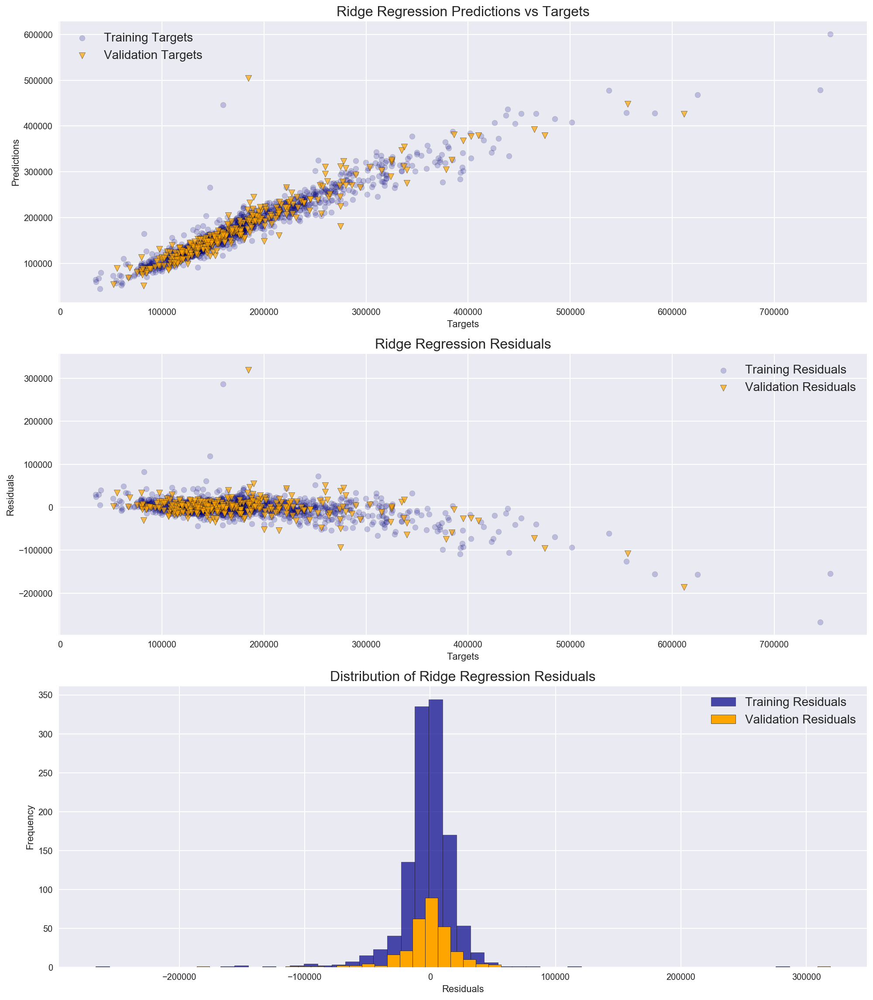

In [10]:
# Calculate residuals
res_train = np.expm1(pred_ridge_tr) - np.expm1(y_train)
res_val = np.expm1(pred_ridge_val) - np.expm1(y_val)

# Plot predictions vs targets
plt.figure(figsize=(14, 16))
plt.subplot(311)
plt.scatter(np.expm1(y_train), np.expm1(pred_ridge_tr), label='Training Targets',
            s=40, c='darkblue', edgecolors='black', alpha=.2)
plt.scatter(np.expm1(y_val), np.expm1(pred_ridge_val), label='Validation Targets',
            s=50, c='orange', edgecolors='black', alpha=.7, marker='v')
plt.title('Ridge Regression Predictions vs Targets', fontsize=16)
plt.xlabel('Targets')
plt.ylabel('Predictions')
plt.legend(fontsize=14)

# Plot residuals
plt.subplot(312)
plt.scatter(np.expm1(y_train), res_train, label='Training Residuals', 
            s=40, c='darkblue', edgecolors='black', alpha=.2)
plt.scatter(np.expm1(y_val), res_val, label='Validation Residuals',
            s=50, c='orange', edgecolors='black', alpha=.7, marker='v')
plt.title('Ridge Regression Residuals', fontsize=16)
plt.xlabel('Targets')
plt.ylabel('Residuals')
plt.legend(fontsize=14)

# Plot residuals distribution
plt.subplot(313)
plt.hist(res_train, bins=50, color='darkblue', label='Training Residuals',alpha=.7)
plt.hist(res_val, bins=50, color='orange', label='Validation Residuals')
plt.title('Distribution of Ridge Regression Residuals', fontsize=16)
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.legend(fontsize=14)

plt.tight_layout()

#### Test Set Predictions

In [11]:
regressor_ridge.fit(scX, y)
pred_ridge_test = np.expm1(regressor_ridge.predict(X_test))
pred_ridge_test

array([ 118923.61106763,  156703.15368097,  179314.45959906, ...,
        166929.93661237,  116832.47111858,  218394.73914164])

### Lasso Regression
Check: [Lasso](http://scikit-learn.org/stable/modules/linear_model.html#lasso)
#### Initialize and Fit Model

In [12]:
regressor_lasso = LassoCV(
    eps=.001, n_alphas=500,
    cv=5, max_iter=1000, selection='random',
    n_jobs=-1, random_state=555
)
regressor_lasso.fit(scX, y)
print('Best alpha: {}'.format(regressor_lasso.alpha_))

Best alpha: 0.004655235457550787


#### Feature Importance & Learning Curves

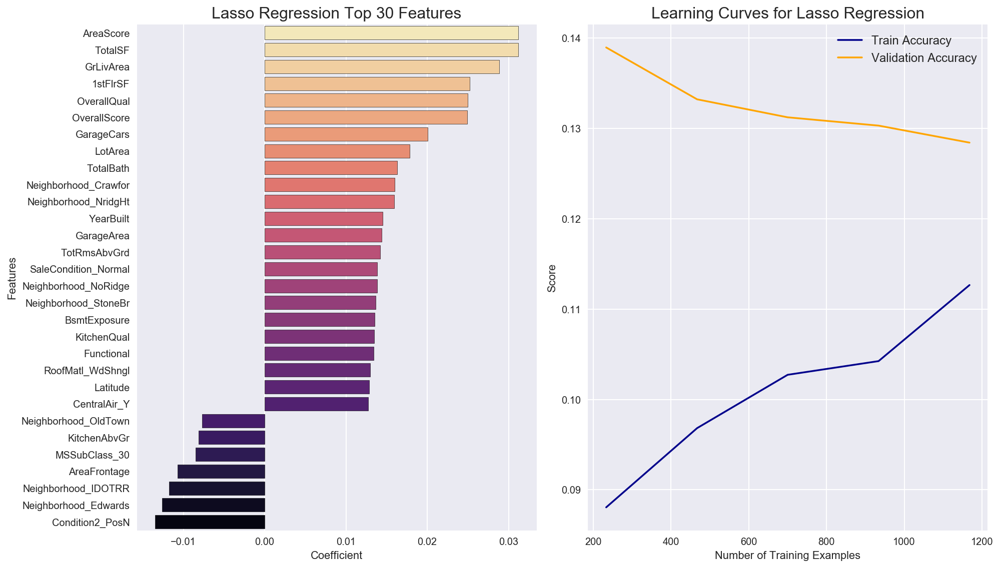

In [13]:
# Extract coefficients
num_features = 30
lasso_coef = pd.Series(data=regressor_ridge.coef_, index = final_df.columns.values)
imp_coef = pd.concat([lasso_coef.sort_values(ascending=False).head(int(num_features//1.3)),
                      lasso_coef.sort_values(ascending=False).tail(int(num_features-num_features//1.3))])


# Calculate learning curves
train_sizes, train_scores, valid_scores = learning_curve(
    estimator=regressor_lasso, X=scX, y=y, 
    train_sizes=[.2, .4, .6, .8, 1.], 
    cv=5, scoring='neg_mean_squared_error', n_jobs=-1)

# Plot feature importances
plt.figure(figsize=(14, 8))
plt.subplot(121)
sns.barplot(x=imp_coef.values, y=imp_coef.index, estimator=np.sum, palette='magma_r')
plt.title('Lasso Regression Top {} Features'.format(num_features), fontsize=16)
plt.xlabel('Coefficient')
plt.ylabel('Features')

# Plot learning curves
plt.subplot(122)
plt.plot(train_sizes, np.sqrt(-train_scores.mean(axis=1)), 
         color='darkblue', label='Train Accuracy')
plt.plot(train_sizes, np.sqrt(-valid_scores.mean(axis=1)), 
         color='orange', label='Validation Accuracy')
plt.title('Learning Curves for Lasso Regression', fontsize=16)
plt.xlabel('Number of Training Examples')
plt.ylabel('Score')
plt.legend(fontsize=12)

plt.tight_layout()

#### Train / Validation Predictions & Residuals

In [14]:
regressor_lasso.fit(X_train, y_train)
pred_lasso_tr = regressor_lasso.predict(X_train)
pred_lasso_val = regressor_lasso.predict(X_val)
print('Validation RMSLE: {}'.format(np.sqrt(mean_squared_error(pred_lasso_val, y_val))))

Validation RMSLE: 0.12602304026845937


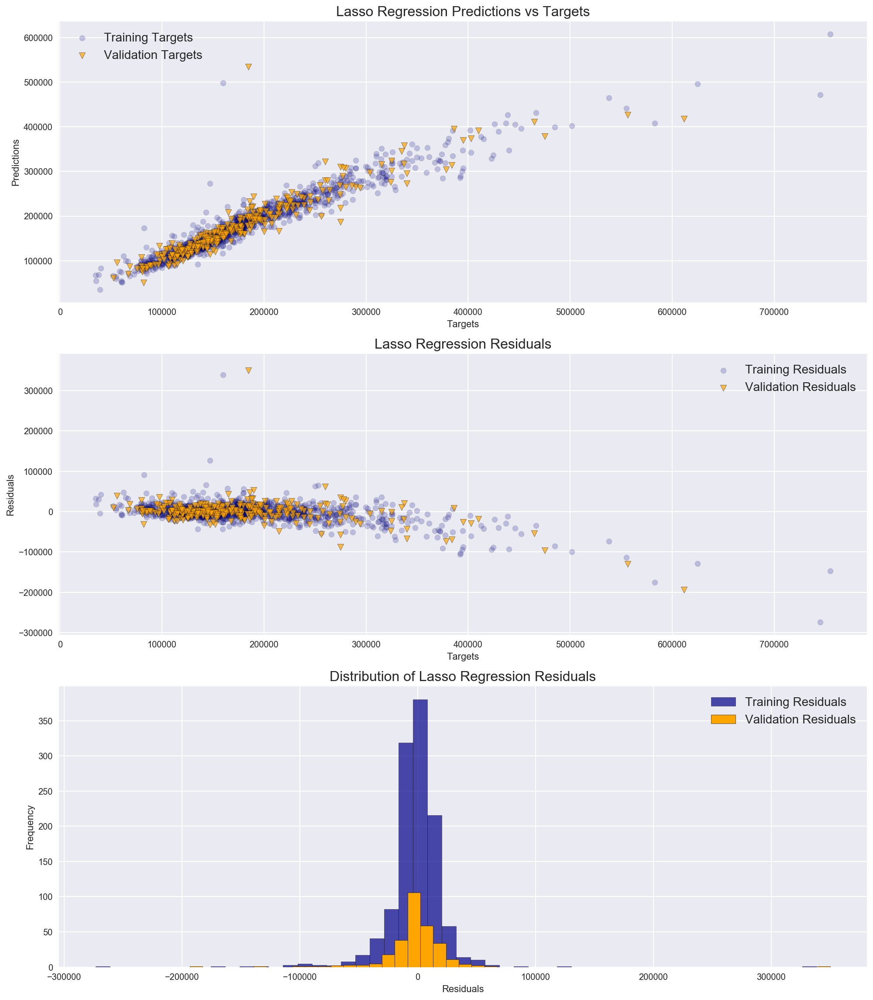

In [15]:
# Calculate residuals
res_train = np.expm1(pred_lasso_tr) - np.expm1(y_train)
res_val = np.expm1(pred_lasso_val) - np.expm1(y_val)

# Plot predictions vs targets
plt.figure(figsize=(14, 16))
plt.subplot(311)
plt.scatter(np.expm1(y_train), np.expm1(pred_lasso_tr), label='Training Targets',
            s=40, c='darkblue', edgecolors='black', alpha=.2)
plt.scatter(np.expm1(y_val), np.expm1(pred_lasso_val), label='Validation Targets',
            s=50, c='orange', edgecolors='black', alpha=.7, marker='v')
plt.title('Lasso Regression Predictions vs Targets', fontsize=16)
plt.xlabel('Targets')
plt.ylabel('Predictions')
plt.legend(fontsize=14)

# Plot residuals
plt.subplot(312)
plt.scatter(np.expm1(y_train), res_train, label='Training Residuals', 
            s=40, c='darkblue', edgecolors='black', alpha=.2)
plt.scatter(np.expm1(y_val), res_val, label='Validation Residuals',
            s=50, c='orange', edgecolors='black', alpha=.7, marker='v')
plt.title('Lasso Regression Residuals', fontsize=16)
plt.xlabel('Targets')
plt.ylabel('Residuals')
plt.legend(fontsize=14)

# Plot residuals distribution
plt.subplot(313)
plt.hist(res_train, bins=50, color='darkblue', label='Training Residuals',alpha=.7)
plt.hist(res_val, bins=50, color='orange', label='Validation Residuals')
plt.title('Distribution of Lasso Regression Residuals', fontsize=16)
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.legend(fontsize=14)

plt.tight_layout()

#### Test Set Predictions

In [16]:
regressor_lasso.fit(scX, y)
pred_lasso_test = np.expm1(regressor_lasso.predict(X_test))
pred_lasso_test

array([ 113985.94135003,  157115.52580159,  179385.71713863, ...,
        165958.73771388,  122166.29545009,  226202.60812683])

### Elastic Net Regression
Check: [Elastic Net](http://scikit-learn.org/stable/modules/linear_model.html#elastic-net)
#### Initialize and Fit Model

In [17]:
regressor_elnet = ElasticNetCV(
    l1_ratio=[.1, .5, .7, .9, .95, .99, 1],
    eps=.001, n_alphas=200,
    cv=5, max_iter=1000, selection='random',
    n_jobs=-1, random_state=555
)
regressor_elnet.fit(scX, y)
print('Best alpha: {}'.format(regressor_elnet.alpha_))
print('Best l1_ratio: {}'.format(regressor_elnet.l1_ratio_))

Best alpha: 0.04112780648520346
Best l1_ratio: 0.1


#### Feature Importance & Learning Curves

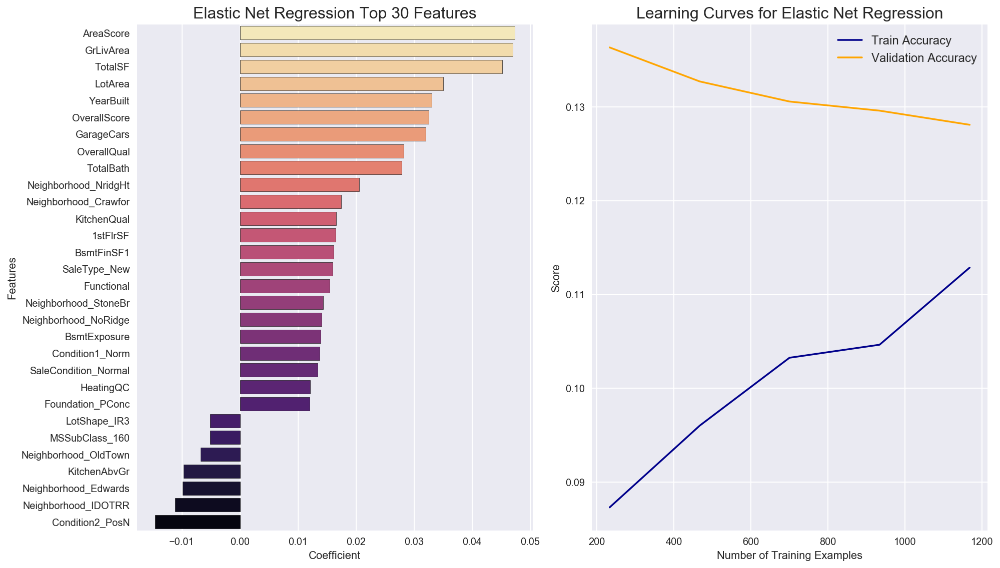

In [18]:
# Extract coefficients
num_features = 30
elnet_coef = pd.Series(data=regressor_elnet.coef_, index = final_df.columns.values)
imp_coef = pd.concat([elnet_coef.sort_values(ascending=False).head(int(num_features//1.3)),
                      elnet_coef.sort_values(ascending=False).tail(int(num_features-num_features//1.3))])

# Calculate learning curves
train_sizes, train_scores, valid_scores = learning_curve(
    estimator=regressor_elnet, X=scX, y=y, 
    train_sizes=[.2, .4, .6, .8, 1.], 
    cv=5, scoring='neg_mean_squared_error', n_jobs=-1
)

# Plot feature importances
plt.figure(figsize=(14, 8))
plt.subplot(121)
sns.barplot(x=imp_coef.values, y=imp_coef.index, estimator=np.sum, palette='magma_r')
plt.title('Elastic Net Regression Top {} Features'.format(num_features), fontsize=16)
plt.xlabel('Coefficient')
plt.ylabel('Features')

# Plot learning curves
plt.subplot(122)
plt.plot(train_sizes, np.sqrt(-train_scores.mean(axis=1)), 
         color='darkblue', label='Train Accuracy')
plt.plot(train_sizes, np.sqrt(-valid_scores.mean(axis=1)), 
         color='orange', label='Validation Accuracy')
plt.title('Learning Curves for Elastic Net Regression', fontsize=16)
plt.xlabel('Number of Training Examples')
plt.ylabel('Score')
plt.legend(fontsize=12)

plt.tight_layout()

#### Train / Validation Predictions & Residuals

In [19]:
regressor_elnet.fit(X_train, y_train)
pred_elnet_tr = regressor_elnet.predict(X_train)
pred_elnet_val = regressor_elnet.predict(X_val)
print('Validation RMSLE: {}'.format(np.sqrt(mean_squared_error(pred_elnet_val, y_val))))

Validation RMSLE: 0.12592679570023


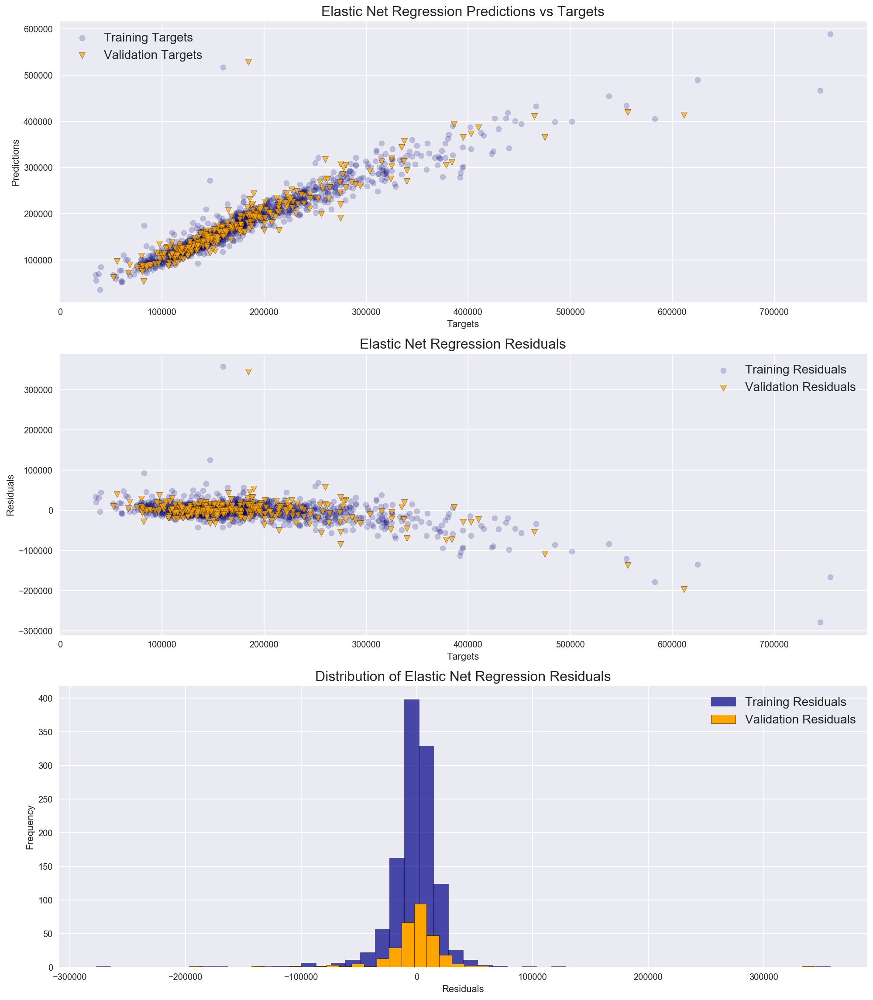

In [20]:
# Calculate residuals
res_train = np.expm1(pred_elnet_tr) - np.expm1(y_train)
res_val = np.expm1(pred_elnet_val) - np.expm1(y_val)

# Plot predictions vs targets
plt.figure(figsize=(14, 16))
plt.subplot(311)
plt.scatter(np.expm1(y_train), np.expm1(pred_elnet_tr), label='Training Targets',
            s=40, c='darkblue', edgecolors='black', alpha=.2)
plt.scatter(np.expm1(y_val), np.expm1(pred_elnet_val), label='Validation Targets',
            s=50, c='orange', edgecolors='black', alpha=.7, marker='v')
plt.title('Elastic Net Regression Predictions vs Targets', fontsize=16)
plt.xlabel('Targets')
plt.ylabel('Predictions')
plt.legend(fontsize=14)

# Plot residuals
plt.subplot(312)
plt.scatter(np.expm1(y_train), res_train, label='Training Residuals', 
            s=40, c='darkblue', edgecolors='black', alpha=.2)
plt.scatter(np.expm1(y_val), res_val, label='Validation Residuals',
            s=50, c='orange', edgecolors='black', alpha=.7, marker='v')
plt.title('Elastic Net Regression Residuals', fontsize=16)
plt.xlabel('Targets')
plt.ylabel('Residuals')
plt.legend(fontsize=14)

# Plot residuals distribution
plt.subplot(313)
plt.hist(res_train, bins=50, color='darkblue', label='Training Residuals',alpha=.7)
plt.hist(res_val, bins=50, color='orange', label='Validation Residuals')
plt.title('Distribution of Elastic Net Regression Residuals', fontsize=16)
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.legend(fontsize=14)

plt.tight_layout()

#### Test Set Predictions

In [21]:
regressor_elnet.fit(scX, y)
pred_elnet_test = np.expm1(regressor_elnet.predict(X_test))
pred_elnet_test

array([ 114974.74552465,  156809.08965515,  178443.34255252, ...,
        165591.25828112,  122404.71577308,  223595.12475145])

### Support Vector Regression
Check: [SVR](http://scikit-learn.org/stable/modules/generated/sklearn.svm.SVR.html#)
#### Initialize and Fit Model

In [22]:
regressor_svr = SVR()
regressor_svr.fit(X_train, y_train)
pred_svr_tr = regressor_svr.predict(X_train)
pred_svr_val = regressor_svr.predict(X_val)
print('Validation RMSLE: {}'.format(np.sqrt(mean_squared_error(pred_svr_val, y_val))))

Validation RMSLE: 0.176670080109377


#### Hyperparameter Tuning with Randomized Search

In [23]:
param_distribs = {
    'kernel': ['linear', 'rbf'],
    'gamma': ss.reciprocal(0.00001, .1),
    'C': ss.reciprocal(0.00001, .1)
}

regressor_svr = SVR()
rnd_search_svr = RandomizedSearchCV(
    estimator=regressor_svr, param_distributions=param_distribs, 
    n_iter=100, cv=10, scoring='neg_mean_squared_error',
    verbose=1, n_jobs=-1, random_state=555
)

rnd_search_svr.fit(scX, y);
print('Best Score: {}'.format(np.sqrt(-rnd_search_svr.best_score_)))

Fitting 10 folds for each of 100 candidates, totalling 1000 fits


[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    3.4s
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed:   19.8s
[Parallel(n_jobs=-1)]: Done 434 tasks      | elapsed:   48.3s
[Parallel(n_jobs=-1)]: Done 784 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 1000 out of 1000 | elapsed:  2.1min finished


Best Score: 0.12842522947113194


In [24]:
regressor_svr = rnd_search_svr.best_estimator_
print(rnd_search_svr.best_params_)

{'C': 0.00049552601125473265, 'gamma': 0.0013279105442149761, 'kernel': 'linear'}


#### Train / Validation Predictions & Residuals

In [25]:
regressor_svr.fit(X_train, y_train)
pred_svr_tra = regressor_svr.predict(X_train)
pred_svr_val = regressor_svr.predict(X_val)
print('Validation RMSLE: {}'.format(np.sqrt(mean_squared_error(pred_svr_val, y_val))))

Validation RMSLE: 0.12278661969492753


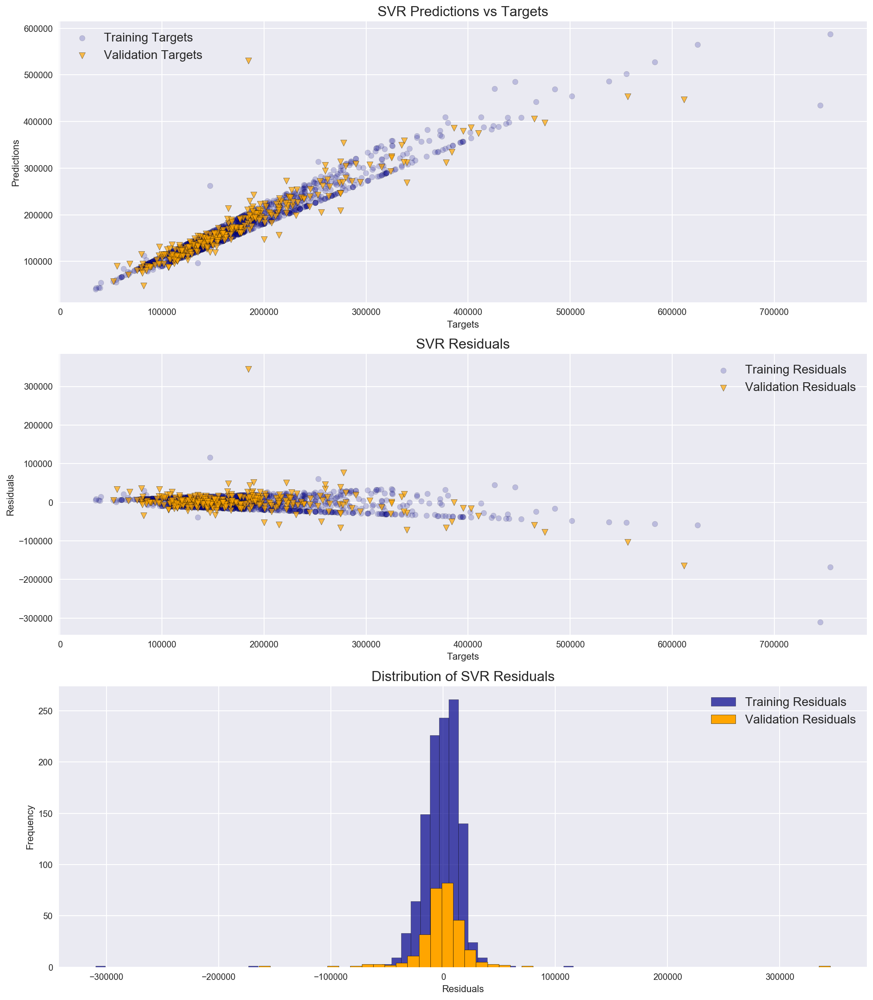

In [26]:
# Calculate residuals
res_train = np.expm1(pred_svr_tr) - np.expm1(y_train)
res_val = np.expm1(pred_svr_val) - np.expm1(y_val)

# Plot predictions vs targets
plt.figure(figsize=(14, 16))
plt.subplot(311)
plt.scatter(np.expm1(y_train), np.expm1(pred_svr_tr), label='Training Targets',
            s=40, c='darkblue', edgecolors='black', alpha=.2)
plt.scatter(np.expm1(y_val), np.expm1(pred_svr_val), label='Validation Targets',
            s=50, c='orange', edgecolors='black', alpha=.7, marker='v')
plt.title('SVR Predictions vs Targets', fontsize=16)
plt.xlabel('Targets')
plt.ylabel('Predictions')
plt.legend(fontsize=14)

# Plot residuals
plt.subplot(312)
plt.scatter(np.expm1(y_train), res_train, label='Training Residuals', 
            s=40, c='darkblue', edgecolors='black', alpha=.2)
plt.scatter(np.expm1(y_val), res_val, label='Validation Residuals',
            s=50, c='orange', edgecolors='black', alpha=.7, marker='v')
plt.title('SVR Residuals', fontsize=16)
plt.xlabel('Targets')
plt.ylabel('Residuals')
plt.legend(fontsize=14)

# Plot residuals distribution
plt.subplot(313)
plt.hist(res_train, bins=50, color='darkblue', label='Training Residuals',alpha=.7)
plt.hist(res_val, bins=50, color='orange', label='Validation Residuals')
plt.title('Distribution of SVR Residuals', fontsize=16)
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.legend(fontsize=14)

plt.tight_layout()

#### Test Set Predictions

In [27]:
regressor_svr.fit(scX, y)
pred_svr_test = np.expm1(regressor_svr.predict(X_test))
pred_svr_test

array([ 120769.9273548 ,  155850.46022424,  177389.62992177, ...,
        170874.23571482,  116214.65306509,  217193.04967212])

### Random Forest
Check: [Random Forest](http://scikit-learn.org/stable/modules/ensemble.html#random-forests)
#### Initialize and Fit Model

In [28]:
regressor_rf = RandomForestRegressor(n_jobs=-1, random_state=555)
regressor_rf.fit(X_train, y_train)
pred_rf = regressor_rf.predict(X_val)
print('Validation RMSLE: {}'.format(np.sqrt(mean_squared_error(pred_rf, y_val))))

Validation RMSLE: 0.1304095430637354


#### Hyperparameter Tuning with Randomized Search

In [29]:
param_distribs = {
    'n_estimators': ss.randint(low=10, high=2000),
    'max_depth': ss.randint(low=1, high=15),
    'min_samples_split': ss.randint(low=2, high=15),
    'min_samples_leaf': ss.randint(low=1, high=15),
    'bootstrap': [True, False]
}

regressor_rf = RandomForestRegressor(n_jobs=-1, random_state=555)
rnd_search_rf = RandomizedSearchCV(
    estimator=regressor_rf, param_distributions=param_distribs, 
    n_iter=50, cv=5, scoring='neg_mean_squared_error',
    verbose=1, n_jobs=-1, random_state=555
)

rnd_search_rf.fit(scX, y);
print('Best Score: {}'.format(np.sqrt(-rnd_search_rf.best_score_)))

Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed:  9.7min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed: 13.0min finished


Best Score: 0.1371090029993507


In [30]:
regressor_rf = rnd_search_rf.best_estimator_
print(rnd_search_rf.best_params_)

{'max_depth': 13, 'bootstrap': True, 'n_estimators': 710, 'min_samples_leaf': 1, 'min_samples_split': 5}


#### Feature Importance & Learning Curves

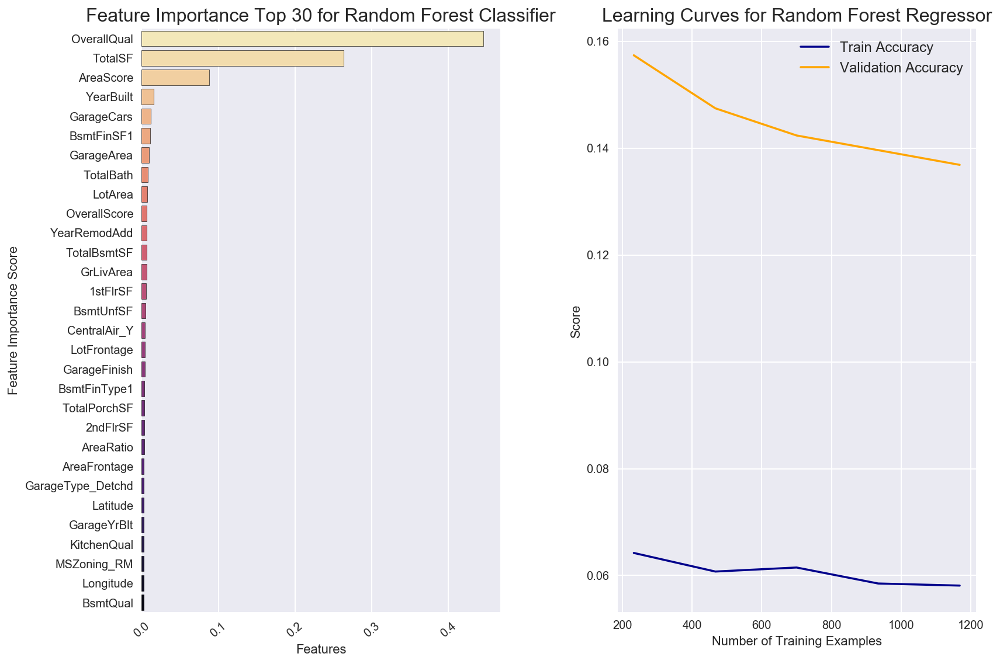

In [31]:
# Extract feature importances
num_features = 30
features = pd.Series(regressor_rf.feature_importances_, 
                     index=final_df.columns, name='Feature_Importance')
features.sort_values(ascending=False, inplace=True)

# Calculate learning curves
train_sizes, train_scores, valid_scores = learning_curve(
    estimator=regressor_rf, X=scX, y=y, 
    train_sizes=[.2, .4, .6, .8, 1.], 
    cv=5, scoring='neg_mean_squared_error', n_jobs=-1
)

# Plot feature importances
plt.figure(figsize=(12, 8))
plt.subplot(121)
sns.barplot(x=features[:num_features], y=features.index[:num_features], estimator=np.sum, 
            palette='magma_r')
plt.xticks(rotation=40)
plt.title('Feature Importance Top {} for Random Forest Classifier'.format(num_features), fontsize=16)
plt.xlabel('Features')
plt.ylabel('Feature Importance Score')

# Plot learning curves
plt.subplot(122)
plt.plot(train_sizes, np.mean(np.sqrt(-train_scores), axis=1), 
         color='darkblue', label='Train Accuracy')
plt.plot(train_sizes, np.mean(np.sqrt(-valid_scores), axis=1), 
         color='orange', label='Validation Accuracy')
plt.title('Learning Curves for Random Forest Regressor', fontsize=16)
plt.xlabel('Number of Training Examples')
plt.ylabel('Score')
plt.legend(fontsize=12)

plt.tight_layout()

#### Train / Validation Predictions & Residuals

In [32]:
regressor_rf.fit(X_train, y_train)
pred_rf_tr = regressor_rf.predict(X_train)
pred_rf_val = regressor_rf.predict(X_val)
print('Validation RMSLE: {}'.format(np.sqrt(mean_squared_error(pred_rf_val, y_val))))

Validation RMSLE: 0.12928696019181343


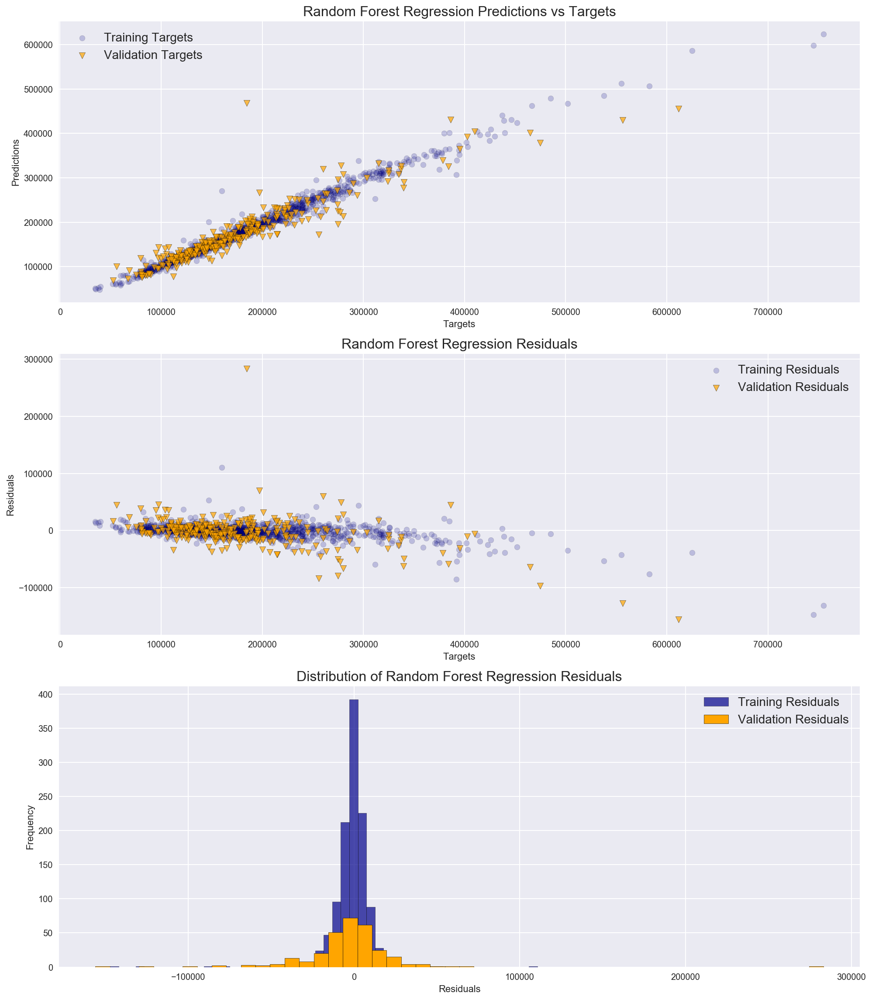

In [33]:
# Calculate residuals
res_train = np.expm1(pred_rf_tr) - np.expm1(y_train)
res_val = np.expm1(pred_rf_val) - np.expm1(y_val)

# Plot predictions vs targets
plt.figure(figsize=(14, 16))
plt.subplot(311)
plt.scatter(np.expm1(y_train), np.expm1(pred_rf_tr), label='Training Targets',
            s=40, c='darkblue', edgecolors='black', alpha=.2)
plt.scatter(np.expm1(y_val), np.expm1(pred_rf_val), label='Validation Targets',
            s=50, c='orange', edgecolors='black', alpha=.7, marker='v')
plt.title('Random Forest Regression Predictions vs Targets', fontsize=16)
plt.xlabel('Targets')
plt.ylabel('Predictions')
plt.legend(fontsize=14)

# Plot residuals
plt.subplot(312)
plt.scatter(np.expm1(y_train), res_train, label='Training Residuals', 
            s=40, c='darkblue', edgecolors='black', alpha=.2)
plt.scatter(np.expm1(y_val), res_val, label='Validation Residuals',
            s=50, c='orange', edgecolors='black', alpha=.7, marker='v')
plt.title('Random Forest Regression Residuals', fontsize=16)
plt.xlabel('Targets')
plt.ylabel('Residuals')
plt.legend(fontsize=14)

# Plot residuals distribution
plt.subplot(313)
plt.hist(res_train, bins=50, color='darkblue', label='Training Residuals',alpha=.7)
plt.hist(res_val, bins=50, color='orange', label='Validation Residuals')
plt.title('Distribution of Random Forest Regression Residuals', fontsize=16)
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.legend(fontsize=14)

plt.tight_layout()

#### Test Set Predictions

In [34]:
regressor_rf.fit(scX, y)
pred_rf_test = np.expm1(regressor_rf.predict(X_test))
pred_rf_test

array([ 128277.63080112,  156661.3269207 ,  171116.60079405, ...,
        160134.36134982,  117393.94609082,  223275.80491119])

### Gradient Tree Boosting
Check: [Gradient Tree Boosting](http://scikit-learn.org/stable/modules/ensemble.html#gradient-tree-boosting)
#### Initialize and Fit Model

In [35]:
regressor_gtb = GradientBoostingRegressor(random_state=555)
regressor_gtb.fit(X_train, y_train)
pred_gtb_val = regressor_gtb.predict(X_val)
print('Validation RMSLE: {}'.format(np.sqrt(mean_squared_error(pred_gtb_val, y_val))))

Validation RMSLE: 0.1271522106964729


#### Hyperparameter Tuning with Randomized Search

In [36]:
param_distribs = {
    'loss': ['ls', 'lad', 'huber'],
    'learning_rate': ss.reciprocal(0.0001, 1),
    'n_estimators': ss.randint(low=50, high=2000),
    'max_depth': ss.randint(low=1, high=15),
    'min_samples_split': ss.randint(low=2, high=15),
    'min_samples_leaf': ss.randint(low=1, high=15),
    'alpha': ss.uniform(0., 1.)
}
regressor_gtb = GradientBoostingRegressor(random_state=555)
rnd_search_gtb = RandomizedSearchCV(
    estimator=regressor_gtb, param_distributions=param_distribs,
    n_iter=50, cv=5, scoring='neg_mean_squared_error',
    verbose=1, n_jobs=-1, random_state=555
)
rnd_search_gtb.fit(scX, y);
print('Best Score: {}'.format(np.sqrt(-rnd_search_gtb.best_score_)))

Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed: 11.6min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed: 18.1min finished


Best Score: 0.12393121606362392


In [37]:
regressor_gtb = rnd_search_gtb.best_estimator_
print(rnd_search_gtb.best_params_)

{'loss': 'lad', 'max_depth': 6, 'alpha': 0.037703911748044883, 'min_samples_split': 2, 'n_estimators': 1786, 'min_samples_leaf': 2, 'learning_rate': 0.019663157428219155}


#### Feature Importance & Learning Curves

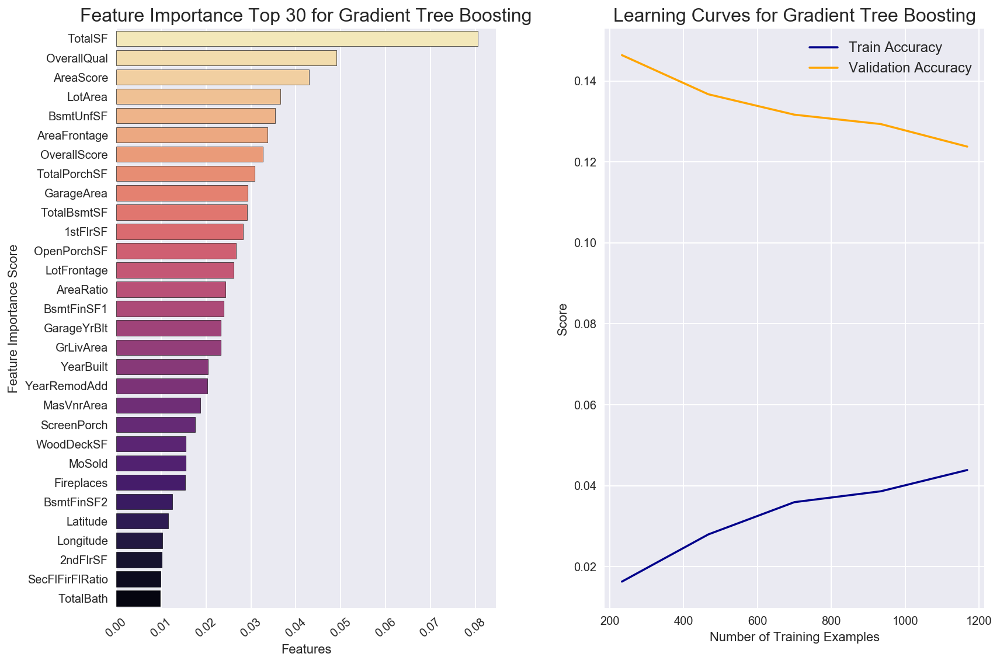

In [38]:
# Extract feature importances
num_features = 30
features = pd.Series(regressor_gtb.feature_importances_, 
                     index=final_df.columns, name='Feature_Importance')
features.sort_values(ascending=False, inplace=True)

# Calculate learning curves
train_sizes, train_scores, valid_scores = learning_curve(
    estimator=regressor_gtb, X=scX, y=y, 
    train_sizes=[.2, .4, .6, .8, 1.], 
    cv=5, scoring='neg_mean_squared_error', n_jobs=-1
)

# Plot feature importances
plt.figure(figsize=(12, 8))
plt.subplot(121)
sns.barplot(x=features[:num_features], y=features.index[:num_features], estimator=np.sum, 
            palette='magma_r')
plt.xticks(rotation=40)
plt.title('Feature Importance Top {} for Gradient Tree Boosting'.format(num_features), fontsize=16)
plt.xlabel('Features')
plt.ylabel('Feature Importance Score')

# Plot learning curves
plt.subplot(122)
plt.plot(train_sizes, np.mean(np.sqrt(-train_scores), axis=1), 
         color='darkblue', label='Train Accuracy')
plt.plot(train_sizes, np.mean(np.sqrt(-valid_scores), axis=1), 
         color='orange', label='Validation Accuracy')
plt.title('Learning Curves for Gradient Tree Boosting', fontsize=16)
plt.xlabel('Number of Training Examples')
plt.ylabel('Score')
plt.legend(fontsize=12)

plt.tight_layout()

#### Train / Validation Predictions & Residuals

In [39]:
regressor_gtb.fit(X_train, y_train)
pred_gtb_tr = regressor_gtb.predict(X_train)
pred_gtb_val = regressor_gtb.predict(X_val)
print('Validation RMSLE: {}'.format(np.sqrt(mean_squared_error(pred_gtb_val, y_val))))

Validation RMSLE: 0.11231985553542072


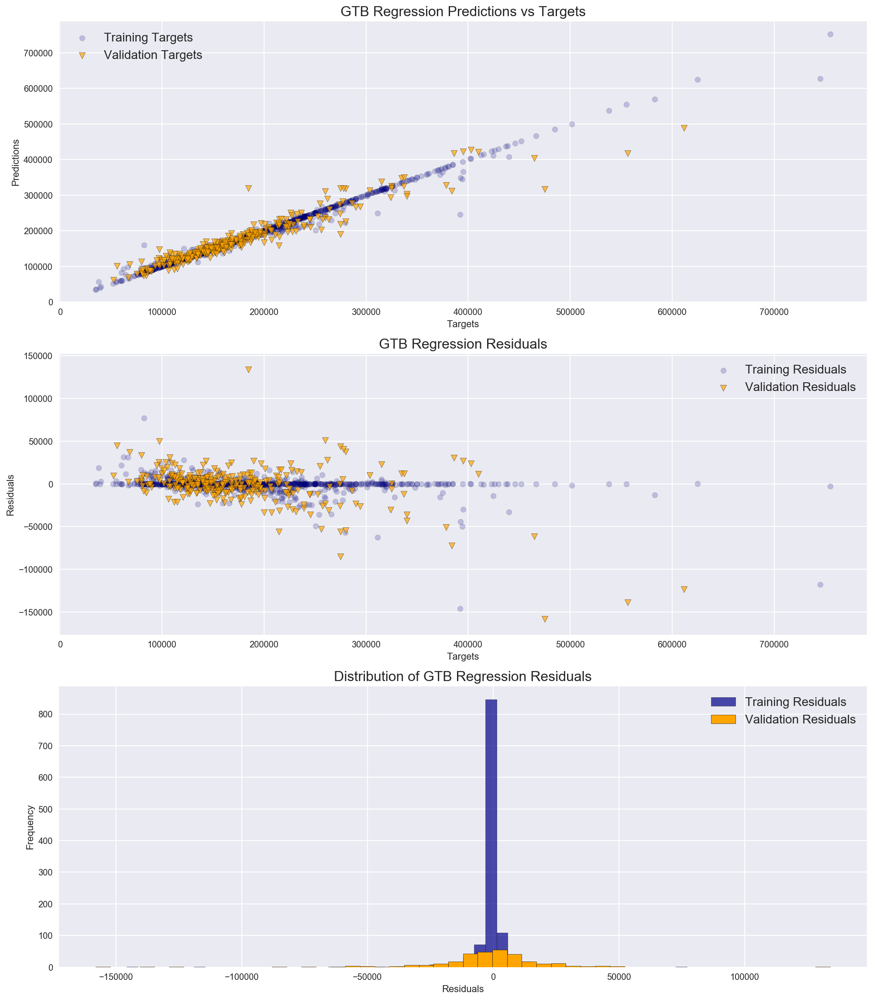

In [40]:
# Calculate residuals
res_train = np.expm1(pred_gtb_tr) - np.expm1(y_train)
res_val = np.expm1(pred_gtb_val) - np.expm1(y_val)

# Plot predictions vs targets
plt.figure(figsize=(14, 16))
plt.subplot(311)
plt.scatter(np.expm1(y_train), np.expm1(pred_gtb_tr), label='Training Targets',
            s=40, c='darkblue', edgecolors='black', alpha=.2)
plt.scatter(np.expm1(y_val), np.expm1(pred_gtb_val), label='Validation Targets',
            s=50, c='orange', edgecolors='black', alpha=.7, marker='v')
plt.title('GTB Regression Predictions vs Targets', fontsize=16)
plt.xlabel('Targets')
plt.ylabel('Predictions')
plt.legend(fontsize=14)

# Plot residuals
plt.subplot(312)
plt.scatter(np.expm1(y_train), res_train, label='Training Residuals', 
            s=40, c='darkblue', edgecolors='black', alpha=.2)
plt.scatter(np.expm1(y_val), res_val, label='Validation Residuals',
            s=50, c='orange', edgecolors='black', alpha=.7, marker='v')
plt.title('GTB Regression Residuals', fontsize=16)
plt.xlabel('Targets')
plt.ylabel('Residuals')
plt.legend(fontsize=14)

# Plot residuals distribution
plt.subplot(313)
plt.hist(res_train, bins=50, color='darkblue', label='Training Residuals',alpha=.7)
plt.hist(res_val, bins=50, color='orange', label='Validation Residuals')
plt.title('Distribution of GTB Regression Residuals', fontsize=16)
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.legend(fontsize=14)

plt.tight_layout()

#### Test Set Predictions

In [41]:
regressor_gtb.fit(scX, y)
pred_gtb_test = np.expm1(regressor_gtb.predict(X_test))
pred_gtb_test

array([ 127180.46178472,  156886.7601842 ,  176213.13316006, ...,
        174248.31082127,  119126.19616467,  210565.3133041 ])

### XGBoost
Check: [XGBoost](http://xgboost.readthedocs.io/en/latest/model.html)
#### Initialize and Fit Model

In [42]:
regressor_xgb = xgb.XGBRegressor(nthread=-1, seed=555)
regressor_xgb.fit(X_train, y_train, eval_set=[(X_val, y_val)], eval_metric='rmse', verbose=False)
pred_xgb_val = regressor_xgb.predict(X_val)
print('Validation RMSLE: {}'.format(np.sqrt(mean_squared_error(pred_xgb_val, y_val))))

Validation RMSLE: 0.12178880385408865


#### Hyperparameter Tuning with Random Search

In [43]:
param_distribs = {
    'learning_rate': ss.reciprocal(0.0001, 1),
    'max_depth': ss.randint(low=2, high=10),
    'n_estimators': ss.randint(low=50, high=1000),
    'gamma': ss.expon(scale=1.0),
    'reg_lambda': ss.reciprocal(0.01, 100),
    'reg_alpha': ss.reciprocal(0.01, 100),
    'min_child_weight': ss.randint(low=1, high=10),
    'max_delta_step': ss.randint(low=0, high=10)
}

regressor_xgb = xgb.XGBRegressor(nthread=-1, seed=555)
rnd_search_xgb = RandomizedSearchCV(
    estimator=regressor_xgb, param_distributions=param_distribs,
    n_iter=50, cv=5, scoring='neg_mean_squared_error',
    verbose=1, n_jobs=-1, random_state=555
)

rnd_search_xgb.fit(scX, y);
print('Best Score: {}'.format(np.sqrt(-rnd_search_xgb.best_score_)))

Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:   21.5s
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  3.4min finished


Best Score: 0.13565998528825216


In [44]:
regressor_xgb = rnd_search_xgb.best_estimator_
print(rnd_search_xgb.best_params_)

{'max_depth': 6, 'min_child_weight': 4, 'gamma': 0.1608651365854292, 'reg_alpha': 0.014614335117501469, 'reg_lambda': 0.74587320350169817, 'n_estimators': 639, 'learning_rate': 0.17517200375870517, 'max_delta_step': 9}


#### Feature Importance & Learning Curves

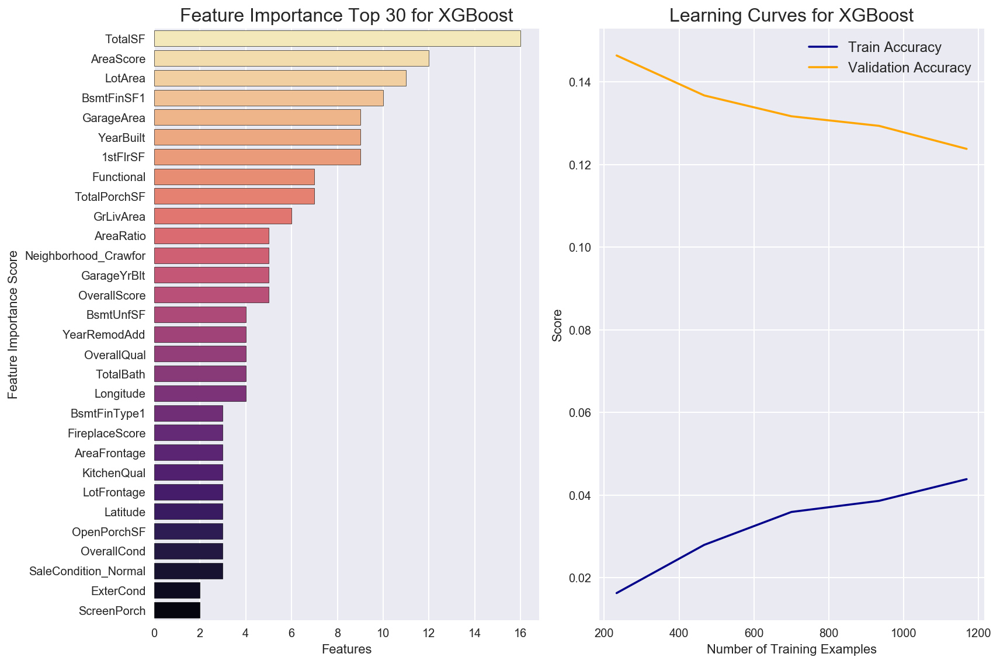

In [45]:
# Extract feature importances
import operator
num_features = 30
importances = regressor_xgb.booster().get_fscore()
features = sorted(importances.items(), key=operator.itemgetter(1), reverse=True)[:num_features]
feat, imp = zip(*features)
feat = list(feat); imp = list(imp)
for i, f in enumerate(feat):
    feat[i] = final_df.columns.values[int(f[1:])]

# Calculate learning curves
train_sizes, train_scores, valid_scores = learning_curve(
    estimator=regressor_gtb, X=scX, y=y, 
    train_sizes=[.2, .4, .6, .8, 1.], 
    cv=5, scoring='neg_mean_squared_error', n_jobs=-1
)

# Plot feature importances
plt.figure(figsize=(12, 8))
plt.subplot(121)
sns.barplot(x=imp, y=feat, estimator=np.sum, palette='magma_r')
plt.title('Feature Importance Top {} for XGBoost'.format(num_features), fontsize=16)
plt.xlabel('Features')
plt.ylabel('Feature Importance Score')

# Plot learning curves
plt.subplot(122)
plt.plot(train_sizes, np.mean(np.sqrt(-train_scores), axis=1), 
         color='darkblue', label='Train Accuracy')
plt.plot(train_sizes, np.mean(np.sqrt(-valid_scores), axis=1), 
         color='orange', label='Validation Accuracy')
plt.title('Learning Curves for XGBoost', fontsize=16)
plt.xlabel('Number of Training Examples')
plt.ylabel('Score')
plt.legend(fontsize=12)

plt.tight_layout()

#### Train / Validation Predictions & Residuals

In [46]:
regressor_xgb.fit(X_train, y_train, eval_set=[(X_val, y_val)], eval_metric='rmse', verbose=False)
pred_xgb_tr = regressor_xgb.predict(X_train)
pred_xgb_val = regressor_xgb.predict(X_val)
print('Validation RMSLE: {}'.format(np.sqrt(mean_squared_error(pred_xgb_val, y_val))))

Validation RMSLE: 0.1291518073868283


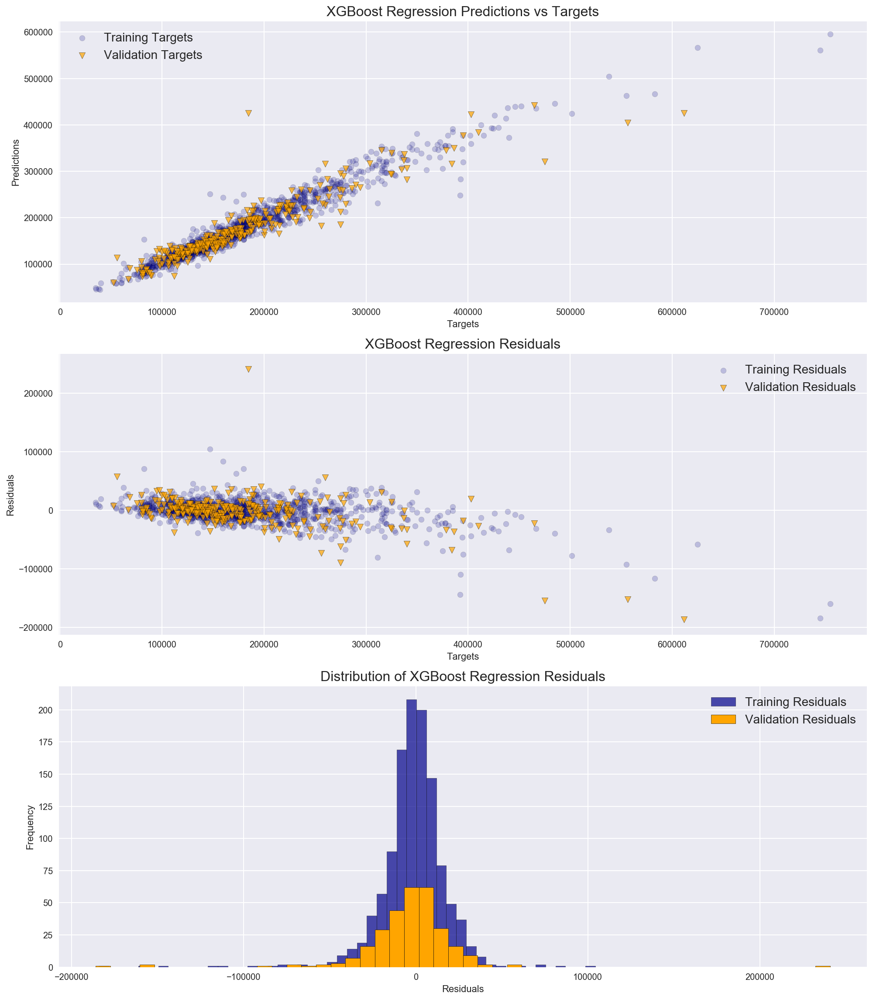

In [47]:
# Calculate residuals
res_train = np.expm1(pred_xgb_tr) - np.expm1(y_train)
res_val = np.expm1(pred_xgb_val) - np.expm1(y_val)

# Plot predictions vs targets
plt.figure(figsize=(14, 16))
plt.subplot(311)
plt.scatter(np.expm1(y_train), np.expm1(pred_xgb_tr), label='Training Targets',
            s=40, c='darkblue', edgecolors='black', alpha=.2)
plt.scatter(np.expm1(y_val), np.expm1(pred_xgb_val), label='Validation Targets',
            s=50, c='orange', edgecolors='black', alpha=.7, marker='v')
plt.title('XGBoost Regression Predictions vs Targets', fontsize=16)
plt.xlabel('Targets')
plt.ylabel('Predictions')
plt.legend(fontsize=14)

# Plot residuals
plt.subplot(312)
plt.scatter(np.expm1(y_train), res_train, label='Training Residuals', 
            s=40, c='darkblue', edgecolors='black', alpha=.2)
plt.scatter(np.expm1(y_val), res_val, label='Validation Residuals',
            s=50, c='orange', edgecolors='black', alpha=.7, marker='v')
plt.title('XGBoost Regression Residuals', fontsize=16)
plt.xlabel('Targets')
plt.ylabel('Residuals')
plt.legend(fontsize=14)

# Plot residuals distribution
plt.subplot(313)
plt.hist(res_train, bins=50, color='darkblue', label='Training Residuals',alpha=.7)
plt.hist(res_val, bins=50, color='orange', label='Validation Residuals')
plt.title('Distribution of XGBoost Regression Residuals', fontsize=16)
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.legend(fontsize=14)

plt.tight_layout()

#### Test Set Predictions

In [49]:
regressor_xgb.fit(scX, y)
pred_xgb_test = np.expm1(regressor_xgb.predict(X_test))
pred_xgb_test

array([ 127651.828125 ,  163462.484375 ,  175808.96875  , ...,
        157442.3125   ,  128796.0390625,  219250.25     ], dtype=float32)

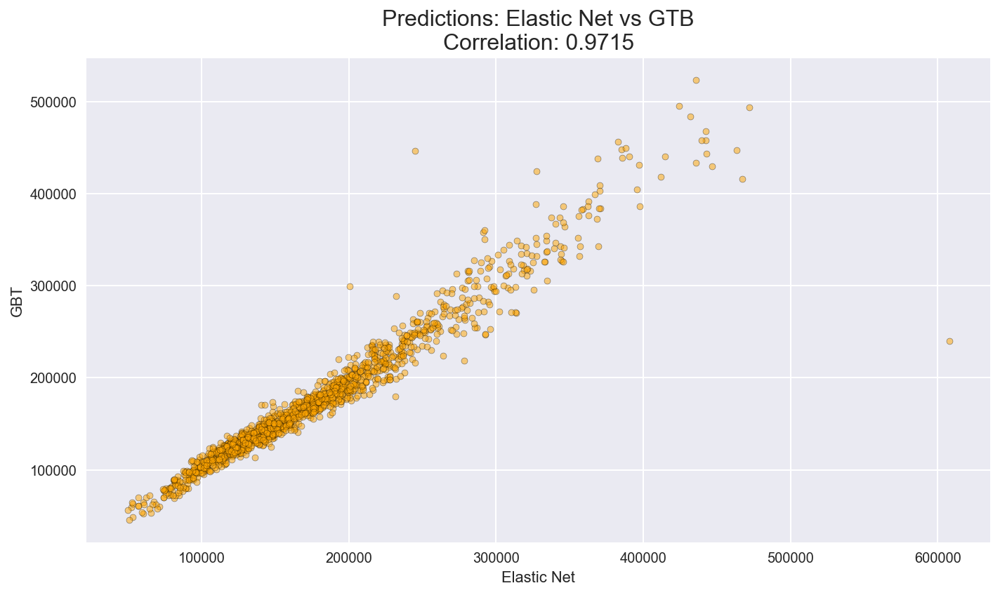

In [50]:
plt.figure(figsize=(10, 6))
x=pred_elnet_test; y=pred_gtb_test
plt.scatter(x, y, s=20, c='orange', edgecolors='black', alpha=.5)
plt.title('Predictions: Elastic Net vs GTB\nCorrelation: {:.4f}'.format(
    np.corrcoef(x, y)[0, 1]), fontsize=16)
plt.xlabel('Elastic Net'); plt.ylabel('GBT')
plt.tight_layout()

In [51]:
submission = pd.DataFrame({'Id': test_df.index,
                           'SalePrice': pred_gtb_test})
submission.to_csv("submission.csv", index=False)